Saving 2.jpg to 2.jpg
Saving 3.jpg to 3.jpg
Saving 6.jpg to 6.jpg
Saving 7.jpg to 7.jpg
Saving 9.jpg to 9.jpg


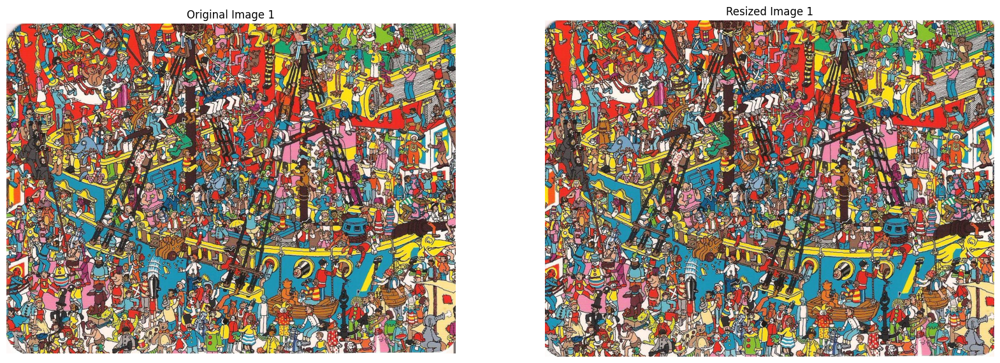

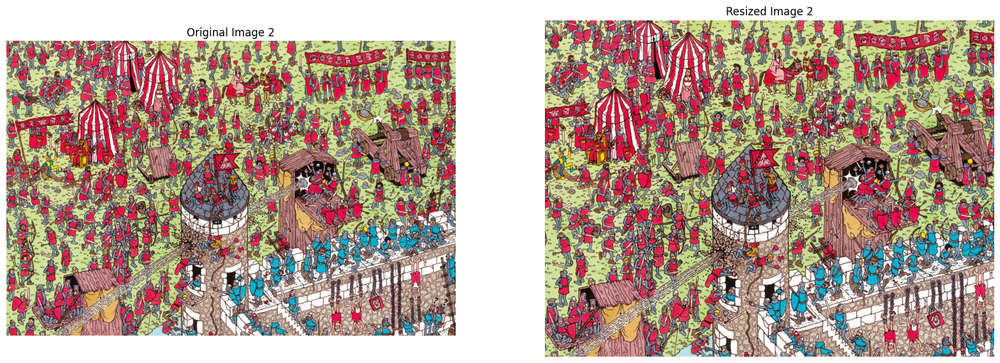

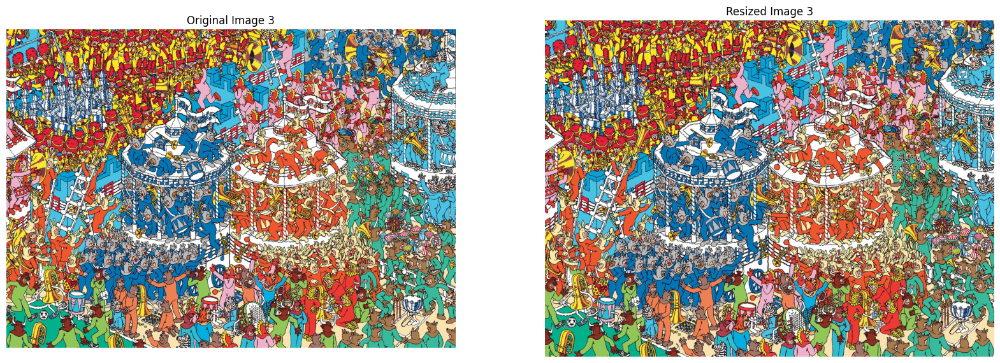

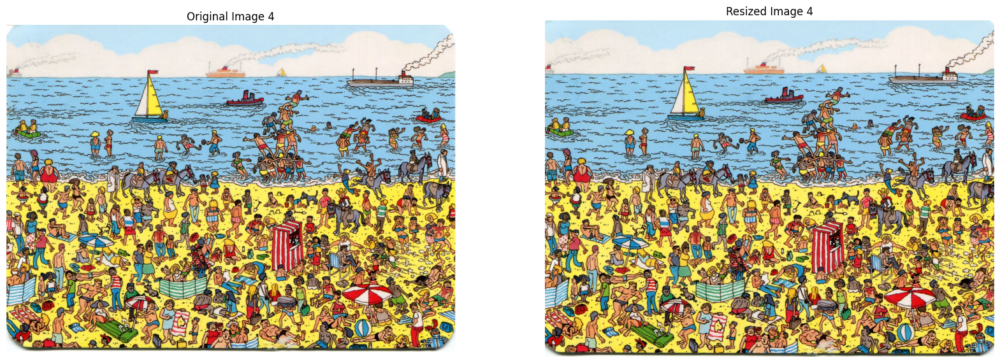

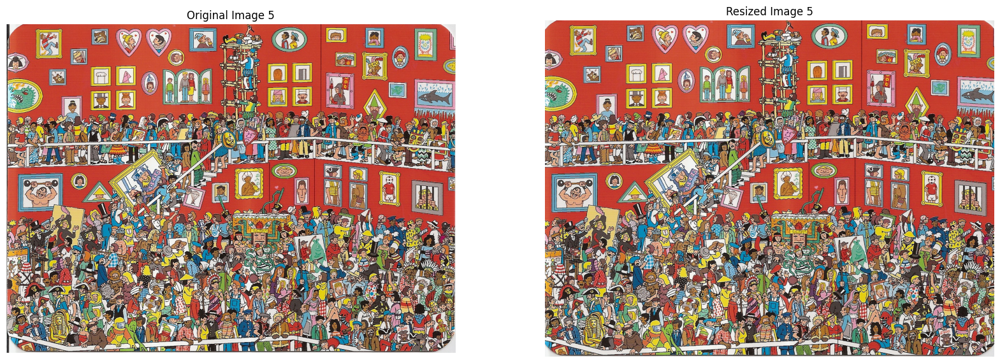

In [1]:
import matplotlib.pyplot as plt
from PIL import Image
from google.colab import files

def resize_image(image_path, output_size):
    img = Image.open(image_path)
    width, height = img.size
    aspect_ratio = 4 / 3

    #計算4:3的裁剪範圍
    if width / height > aspect_ratio:
        #圖片太寬，以高度為基準計算新寬度
        new_width = int(height * aspect_ratio)
        new_height = height
    else:
        #圖片太高，以寬度為基準計算新高度
        new_width = width
        new_height = int(width / aspect_ratio)

    #計算裁剪的範圍（從中心開始）
    left = (width - new_width) // 2
    top = (height - new_height) // 2
    right = left + new_width
    bottom = top + new_height

    #裁剪4:3區域
    img_cropped = img.crop((left, top, right, bottom))

    #調整大小
    img_resized = img_cropped.resize(output_size, Image.LANCZOS)

    return img_resized

#執行
files.upload()  #上傳圖片
img_size = (2048, 1536) #能以(256, 256)分割成8x6個區塊
img_num = [2, 3, 6 ,7 ,9] #原本dataset的原圖編號



for i in range(len(img_num)):
  img = Image.open("{}.jpg" .format(str(img_num[i])))
  output_image = resize_image("{}.jpg" .format(img_num[i]), (2048, 1536))

  #顯示原圖和調整過大小的圖片
  plt.figure(figsize=(20, 15))

  plt.subplot(1, 2, 1)
  plt.title("Original Image {}" .format(str(i+1)))
  plt.imshow(img)
  plt.axis("off")

  plt.subplot(1, 2, 2)
  plt.title("Resized Image {}" .format(str(i+1)))
  plt.imshow(output_image)
  plt.axis("off")

  plt.show()

  #儲存圖片
  try:
    file_name = "0{}.jpg" .format(str(i+1))
    output_image.save(file_name)
  #   files.download(file_name) #下載到瀏覽器的預設路徑
  #   print("{}儲存成功" .format(file_name))

  except Exception as e:
    print("{}儲存錯誤:{}" .format(file_name, e))

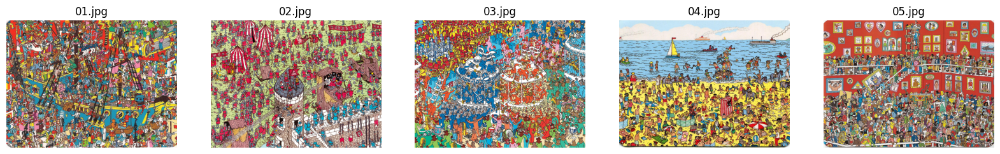

In [3]:
#讀取調整過大小的圖片
images = [None] * 5
plt.figure(figsize=(20, 15))

for i in range(5):
  images[i] = Image.open(f"0{i+1}.jpg")
  plt.subplot(1, 5, i+1)
  plt.title(f"0{i+1}.jpg")
  plt.imshow(images[i])
  plt.axis("off")

plt.show()

In [4]:
#圖片分割
import numpy as np
import matplotlib.pyplot as plt
import os
import shutil
from PIL import Image
from google.colab import files

img_width, img_height = 2048, 1536
block_size = 256
num_row = img_height // block_size
num_col = img_width // block_size

output_folder = "split"
os.makedirs(output_folder, exist_ok=True)

#處理每張圖片
for i, img in enumerate(images):
  for row in range(num_row):
    for col in range(num_col):
      left = col * block_size
      top = row * block_size
      right = left + block_size
      bottom = top + block_size

      #切割圖片
      block = img.crop((left, top, right, bottom))

      #儲存檔案 (原圖_列_行.jpg)
      file_name = f"0{i+1}_{col+1}_{row+1}.jpg"
      block.save(os.path.join(output_folder, file_name))

print("圖片切割完成！")

shutil.make_archive("split", "zip", output_folder)
files.download("split.zip")

print("split.zip 儲存成功")

圖片切割完成！


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

split.zip 儲存成功
